# Analysis of RPM (CellTagged Pre- and Post-Cre) and RPMA (CellTagged Pre-Cre) basal-organoid-derived alllograft tumours
## Ireland et al., 2025
### Related to Fig. 3e-l, Fig. 4c-j, Extended Data Fig. 5c,e,f, and Extended Data Fig. 6a-f

Modified from [original file (Fig3-4_ExtFig5-6_RPM_RPMA_Allografts_CellTag_CellRank_Final_Clean.ipynb) on GitHub](https://github.com/TGOliver-lab/Ireland_Basal_SCLC_2025/blob/main/Python_Code/Fig3-4_ExtFig5-6_RPM_RPMA_Allografts_CellTag_CellRank_Final_Clean.ipynb)  

In [1]:
#Import relevant packages
import numpy as np
import pandas as pd
from matplotlib import rcParams
import os
import scanpy as sc

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm # color maps
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap

#For nice color schemes
import cmocean

#For barplots
import seaborn as sns

# CellRank
import cellrank as cr
from cellrank.kernels import PseudotimeKernel
from cellrank.estimators import GPCCA

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, dpi_save=300, facecolor='white')

### Define color palettes

In [3]:
pheno_col = [
    "#66A61E",  # already hex
    "#40E0D0",  # turquoise
    "red",      # brown2
    "#68228B",  # darkorchid4
    "#1E90FF",  # dodgerblue
    "#00868B",  # turquoise4
    "#00868B",  # turquoise4
    "#00868B",  # turquoise4
    "#FFA500",  # orange
]

cmap = plt.cm.get_cmap("Spectral")

### Load data

In [4]:
adata2 = sc.read_h5ad("../data/050125_RPM_RPMA_TBOAllo_CellTagAnalysis_New_1.2_fate_FAprojection_DPT_final.h5ad")
adata2

AnnData object with n_obs × n_vars = 26618 × 55491
    obs: 'Genotype', 'GenoCT', 'Model', 'Cre', 'UnID', 'Batch', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'n_genes', 'log1p_total_counts', 'leiden_scVI_1.1', 'cluster', 'leiden_scVI_1.2', 'dpt_pseudotime', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'clusters_gradients', 'cell_type'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean_', 'frac_zero'
    uns: 'GenoCT_colors', 'Genotype_colors', 'UnID_colors', 'cell_type_colors', 'clusters_gradients_colors', 'coarse_fwd', 'dendrogram_leiden_scVI_1.2', 'diffmap_evals', 'draw_graph', 'eigendecomposition_fwd', 'hvg', 'iroot', 'leiden', 'leiden_scVI_1.1_colors', 'leiden_scVI_1.2_colors', 'macrostates_fwd_colors', 'neighbors', 'schur_matrix_fwd', 'term_states_fwd_colors', 'u

# CellRank Analysis

### Perform CellRank analyses by leiden cluster for Fig. 4i,j and Extended Data Fig. 6e,f

### Visualize FA map by fate, as depicted in Fig. 3c

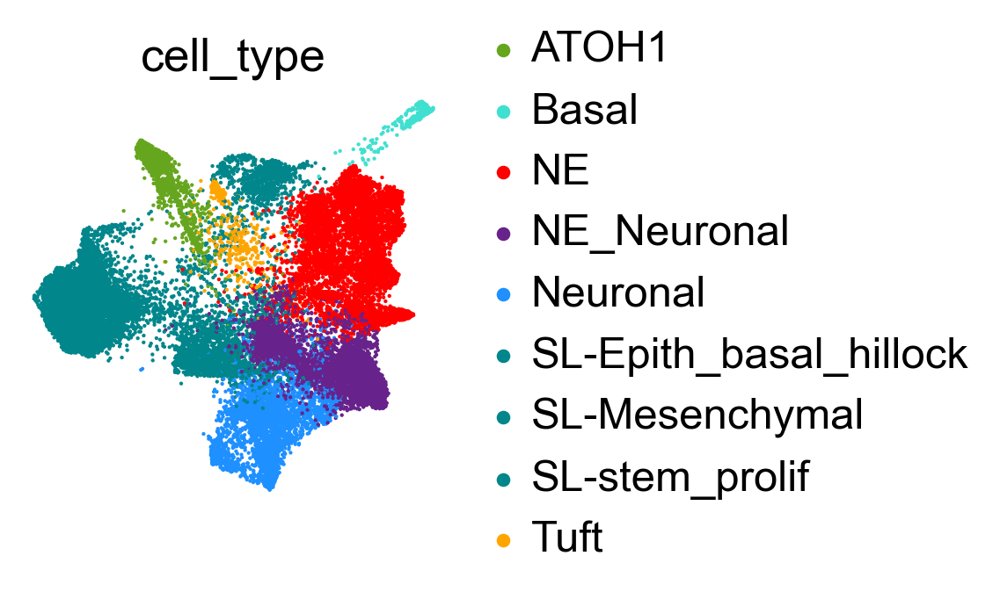

In [51]:
sc.pl.draw_graph(adata2, color=['cell_type'], legend_loc='right margin', color_map=cmap, 
                 palette=pheno_col, frameon=False, size=15)    

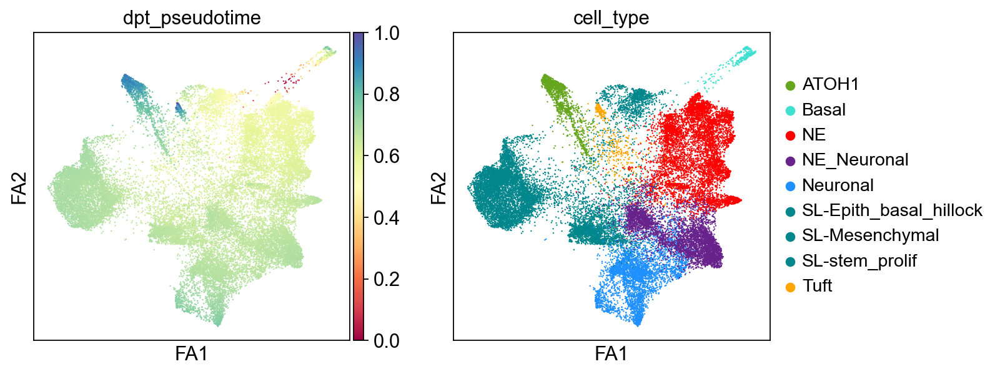

In [6]:

    
sc.pl.draw_graph(adata2, color=['dpt_pseudotime','cell_type'], legend_loc='right margin', color_map=cmap, 
                 palette=pheno_col)



### Visualize key fate genes in FA space as in Extended Data Fig. 6d

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_35107/482596841.py:12: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


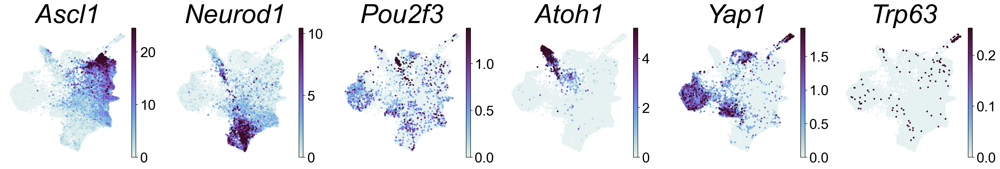

In [7]:
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.draw_graph(adata2, color=['Ascl1','Neurod1','Pou2f3','Atoh1','Yap1','Trp63'], legend_loc='right margin', color_map="cmo.dense", 
                  ncols=6, frameon=False, size=35, vmax='p99.5',  layer="norm",show=False,return_fig=True)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

### Perform CellRank analyses following published tutorial

In [8]:
pk = PseudotimeKernel(adata2, time_key="dpt_pseudotime")

In [9]:
pk.compute_transition_matrix()

  0%|          | 0/26618 [00:00<?, ?cell/s]

PseudotimeKernel[n=26618, dnorm=False, scheme='hard', frac_to_keep=0.3]

  0%|          | 0/100 [00:00<?, ?sim/s]

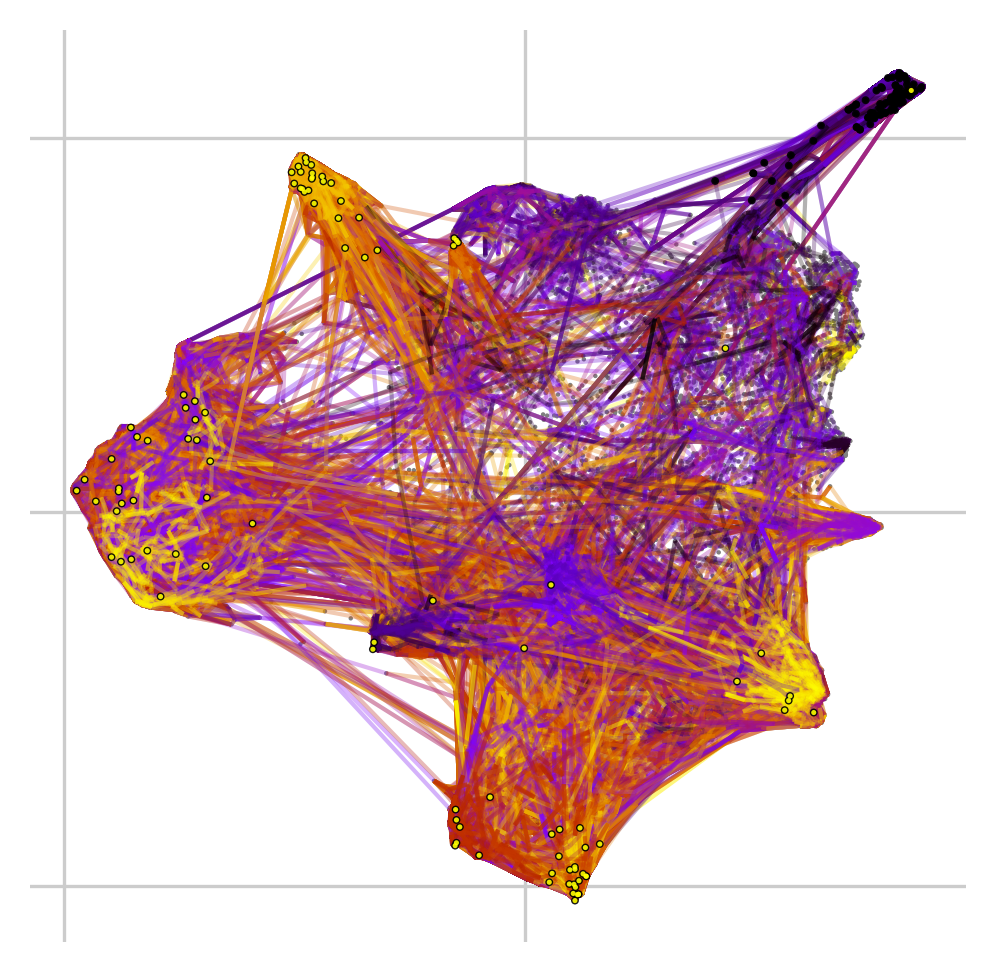

In [10]:
pk.plot_random_walks(
    seed=0,
    n_sims=100,
    start_ixs={"leiden_scVI_1.2": "17"},
    basis="X_draw_graph_fa",
    legend_loc="right",
    dpi=150
)

In [11]:

g = GPCCA(pk)
print(g)

GPCCA[kernel=PseudotimeKernel[n=26618], initial_states=None, terminal_states=None]


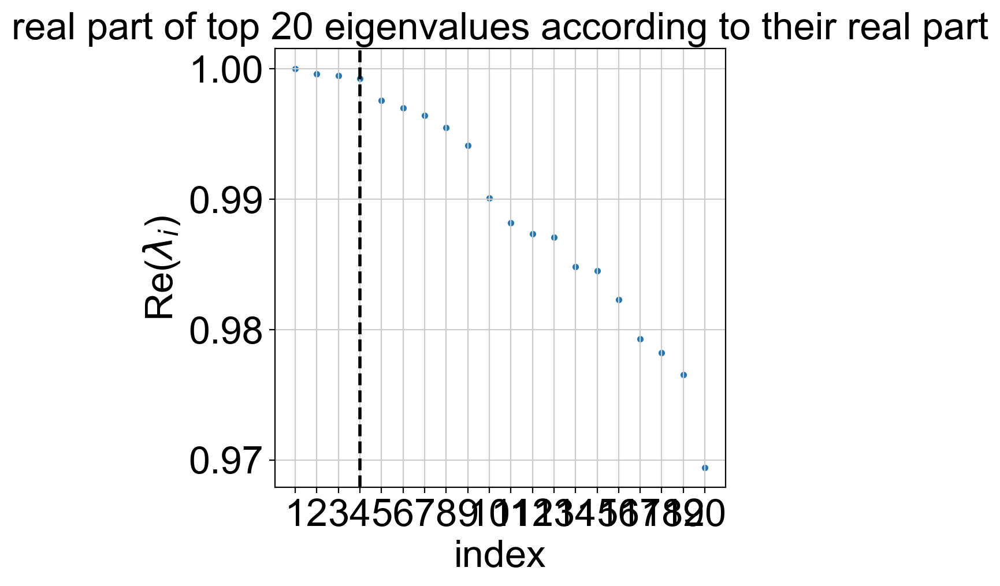

In [12]:
g.compute_schur()
g.plot_spectrum(real_only=True)

/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


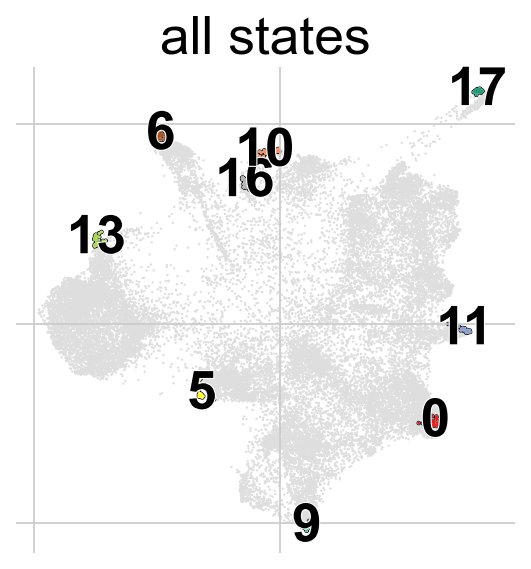

In [13]:
g.fit(n_states=9, cluster_key="leiden_scVI_1.2")
g.plot_macrostates(which="all",basis='X_draw_graph_fa')

/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


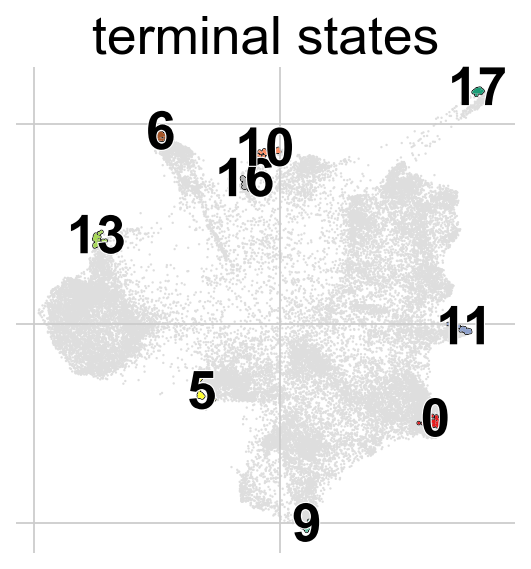

In [14]:
g.predict_terminal_states(allow_overlap=True)
g.plot_macrostates(which="terminal",basis='X_draw_graph_fa')

/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:694: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/utils.py:1397: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)


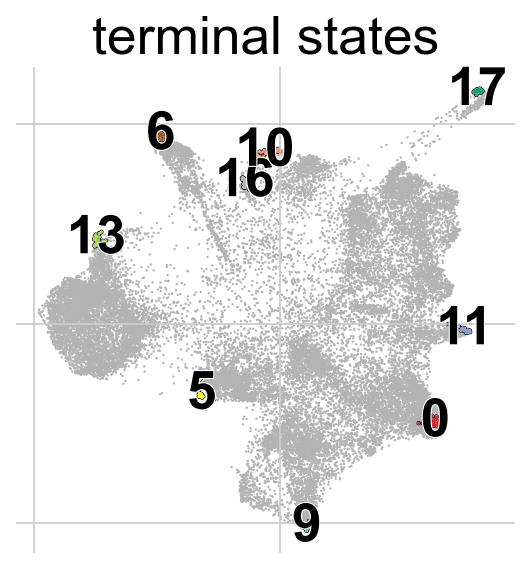

In [15]:
g.plot_macrostates(which="terminal",basis='X_draw_graph_fa',
                   palette=["#B3B3B3","#1B9E77","#FC8D62","#8DA0CB","#FFFF33", "#A65628","#E41A1C","#66C2A5","#A6D854"])

  0%|          | 0/9 [00:00<?, ?/s]

/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


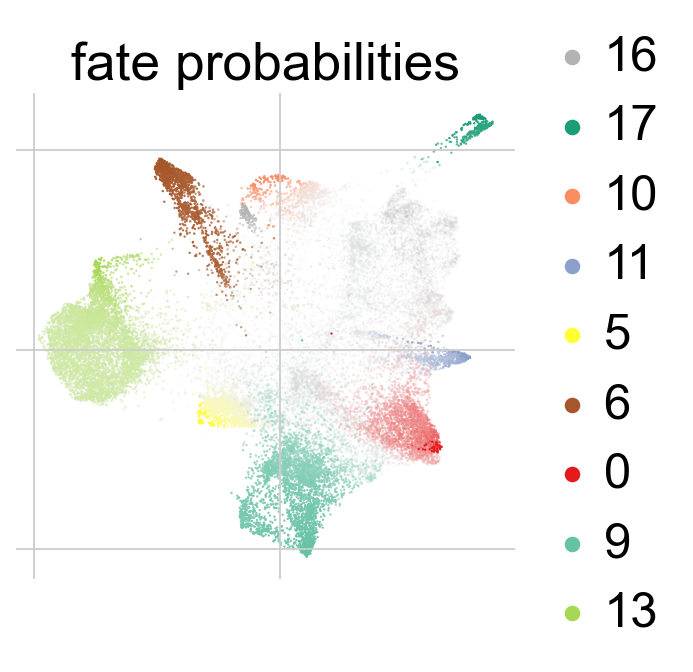

In [16]:
# How likely it is for each cell to reach its terminal state
g.compute_fate_probabilities()
g.plot_fate_probabilities(legend_loc="right",basis="X_draw_graph_fa")


/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
/Users/darren/conda/envs/scrnaseq312/lib/python3.12/site-packages/scvelo/plotting/scatter.py:656: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


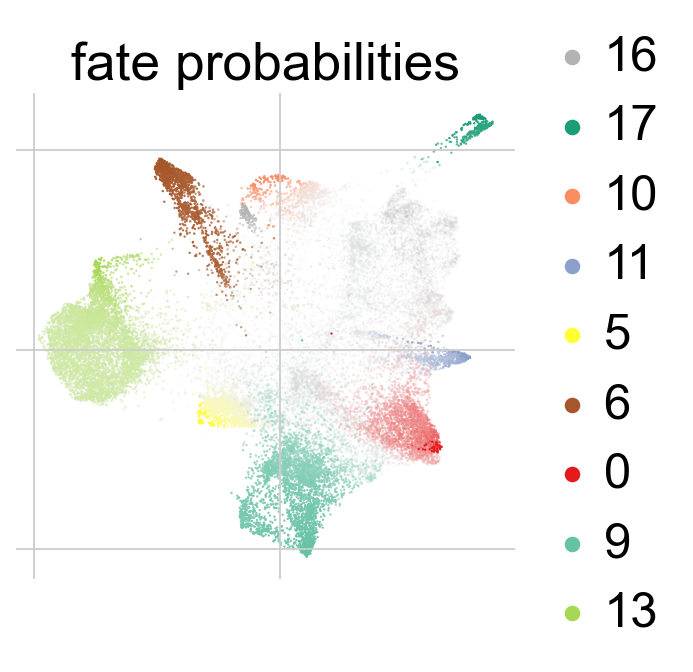

In [17]:
g.plot_fate_probabilities(legend_loc="right",basis="X_draw_graph_fa", 
                          palette=["#B3B3B3","#1B9E77","#FC8D62","#8DA0CB","#FFFF33", "#A65628","#E41A1C","#66C2A5","#A6D854"])


### Visualize CellRank results in circle plots (Fig. 4i)

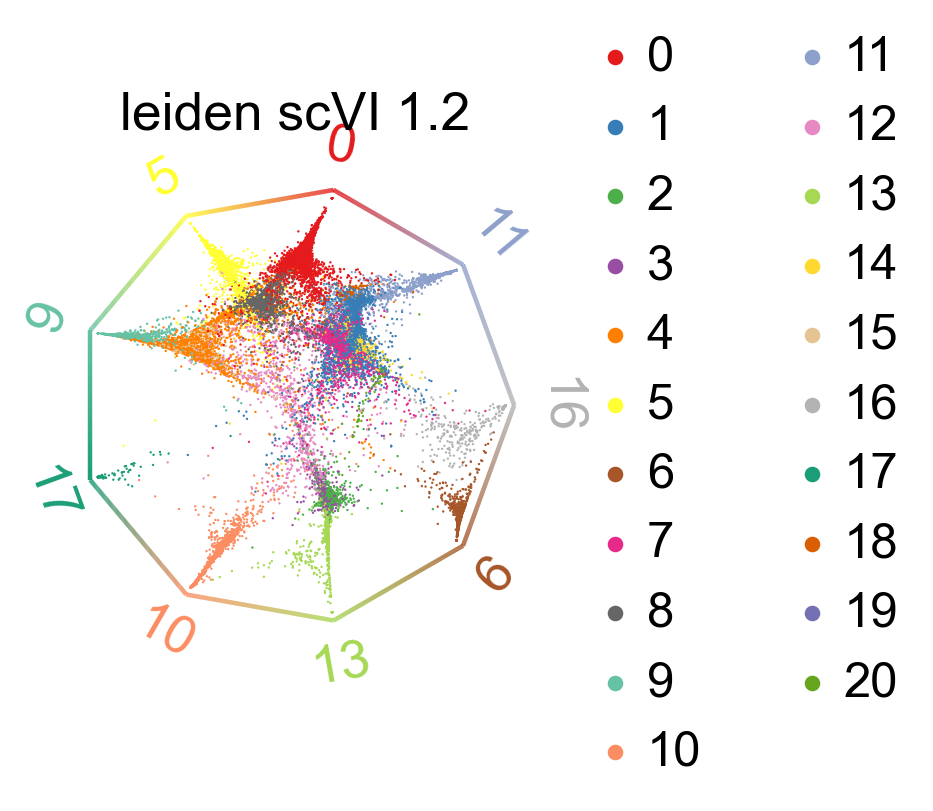

In [18]:
palette=[
  "#E41A1C", # strong red
  "#377EB8", # medium blue
  "#4DAF4A", # green
  "#984EA3", # purple
  "#FF7F00", # orange
  "#FFFF33", # yellow
  "#A65628", # brown
  "#e7298a", # pink
  "#666666", # grey
  "#66C2A5", # teal
  "#FC8D62", # salmon
  "#8DA0CB", # soft blue
  "#E78AC3", # soft pink (different from 8)
  "#A6D854", # light green (but yellowish tint, not green)
  "#FFD92F", # lemon yellow
  "#E5C494", # light brown
  "#B3B3B3", # light grey
  "#1B9E77", # deep teal
  "#D95F02", # dark orange
  "#7570B3", # strong purple
  "#66A61E"]  # olive green (NOT same green as before)


cr.pl.circular_projection(adata2, keys="leiden_scVI_1.2", legend_loc="right", palette=palette)

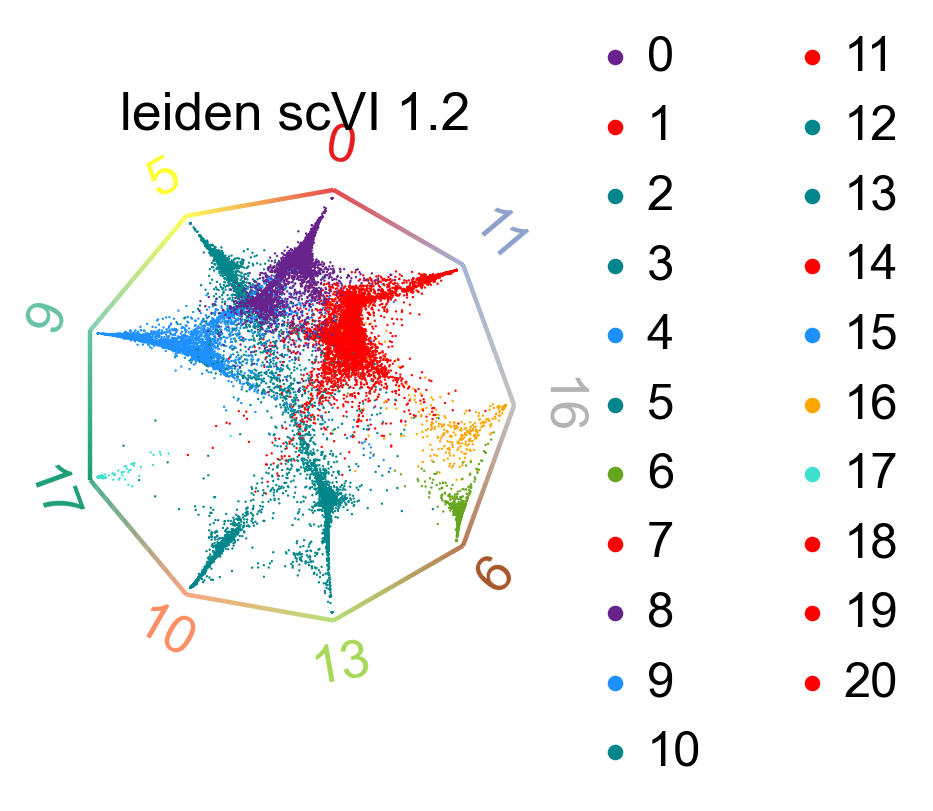

In [19]:
pheno = ['#68228B','red','#00868B', '#00868B','#1E90FF','#00868B','#66A61E','red',
    '#68228B','#1E90FF','#00868B','red','#00868B','#00868B','red','#1E90FF', '#FFA500',
    '#40E0D0', 'red', 'red','red']

cr.pl.circular_projection(adata2, keys="leiden_scVI_1.2", legend_loc="right", palette=pheno)

### Compute all predicted CellRank drivers for export to Supplementary table, by Leiden cluster

In [20]:
all_drivers = g.compute_lineage_drivers()
all_drivers.head(50)

,16_corr,16_pval,16_qval,16_ci_low,16_ci_high,17_corr,17_pval,17_qval,17_ci_low,17_ci_high,...,9_corr,9_pval,9_qval,9_ci_low,9_ci_high,13_corr,13_pval,13_qval,13_ci_low,13_ci_high
Ovol3,0.767031,0.0,0.0,0.762040,0.771931,-0.007224,2.385798e-01,5.102424e-01,-0.019236,0.004790,...,-0.071027,3.801178e-31,2.391246e-30,-0.082969,-0.059064,-0.048860,1.495080e-15,4.792124e-15,-0.060837,-0.036868
Gng13,0.744042,0.0,0.0,0.738631,0.749357,-0.006682,2.756303e-01,5.723662e-01,-0.018694,0.005331,...,-0.070195,1.855349e-30,1.149130e-29,-0.082139,-0.058231,-0.043196,1.771600e-12,5.278324e-12,-0.055180,-0.031199
Gnb3,0.734178,0.0,0.0,0.728590,0.739667,-0.007193,2.405784e-01,5.135849e-01,-0.019205,0.004820,...,-0.066740,1.099633e-27,6.466012e-27,-0.078690,-0.054771,-0.048363,2.876830e-15,9.157288e-15,-0.060341,-0.036371
Bmx,0.695167,0.0,0.0,0.688907,0.701323,0.008172,1.824368e-01,4.107316e-01,-0.003841,0.020184,...,-0.066801,9.857632e-28,5.800693e-27,-0.078751,-0.054832,-0.044894,2.317793e-13,7.054039e-13,-0.056877,-0.032899
Plcb2,0.689067,0.0,0.0,0.682705,0.695325,-0.005551,3.651750e-01,7.063669e-01,-0.017563,0.006463,...,-0.063206,5.412904e-25,3.014815e-24,-0.075163,-0.051232,-0.043524,1.202443e-12,3.597545e-12,-0.055509,-0.031527
Ptgs1,0.612011,0.0,0.0,0.604442,0.619470,0.008502,1.654255e-01,3.791355e-01,-0.003512,0.020513,...,-0.060213,7.948152e-23,4.208741e-22,-0.072174,-0.048235,-0.039644,9.741201e-11,2.774252e-10,-0.051633,-0.027644
Chil1,0.596648,0.0,0.0,0.588855,0.604329,-0.004828,4.308970e-01,7.910468e-01,-0.016840,0.007186,...,-0.057539,5.594166e-21,2.833129e-20,-0.069504,-0.045557,-0.041538,1.198156e-11,3.496765e-11,-0.053525,-0.029539
C030029H02Rik,0.591679,0.0,0.0,0.583815,0.599431,-0.005581,3.625337e-01,7.028177e-01,-0.017593,0.006432,...,-0.049964,3.408810e-16,1.520781e-15,-0.061940,-0.037973,-0.043113,1.951123e-12,5.805431e-12,-0.055098,-0.031116
Pou2f3,0.579322,0.0,0.0,0.571285,0.587248,-0.009877,1.070800e-01,2.624620e-01,-0.021888,0.002136,...,-0.066522,1.629005e-27,9.535433e-27,-0.078472,-0.054552,-0.002335,7.032968e-01,7.593711e-01,-0.014348,0.009679
Rgs13,0.572527,0.0,0.0,0.564396,0.580548,-0.005368,3.811464e-01,7.280559e-01,-0.017380,0.006646,...,-0.052301,1.339604e-17,6.222971e-17,-0.064274,-0.040313,-0.037666,7.855488e-10,2.174035e-09,-0.049657,-0.025665


In [21]:
all_drivers.to_csv("050825_AllDrivers_RPM_RPMA_Allo_CellRank_ByLeiden_log1pnorm.csv")

### Use GAM model to compute specific lineage drivers and generate heatmaps in Fig. 4j and Extended Data Fig. 6f

In [22]:
# Use safe model settings
model = cr.models.GAM(adata2, max_iter=6000, spline_order=3,n_knots=10)


In [23]:
# Compute lineage drivers, allowing partially failed genes
tuft_drivers = g.compute_lineage_drivers(
    lineages="16",
    model=model)


In [24]:
genes = tuft_drivers.head(50).index
genes

Index(['Ovol3', 'Gng13', 'Gnb3', 'Bmx', 'Plcb2', 'Ptgs1', 'Chil1',
       'C030029H02Rik', 'Pou2f3', 'Rgs13', 'Ltc4s', 'Atp2a3', 'Kcnq3',
       'Arhgap8', 'Matk', 'Stac3', 'Avil', 'Plaat3', 'Krt77', 'Mgst3',
       'Ahnak2', '4930412C18Rik', 'Tmem54', 'Lamb2', 'Gm50339', 'Gm13176',
       'Espn', 'Platr10', 'Itpr3', 'Anxa4', 'Ankrd33b', 'Ethe1', 'Lrmp',
       'Crlf1', 'Ascl2', 'Clmn', 'Akain1', 'Ly6g6f', 'Gm26542', 'Krt18',
       'Lrrc6', 'Tekt5', 'Rab25', 'Ighg1', 'Cbr3', 'Krt222', 'Bglap3', 'Cd79b',
       'Lmo1', 'Hmx3'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

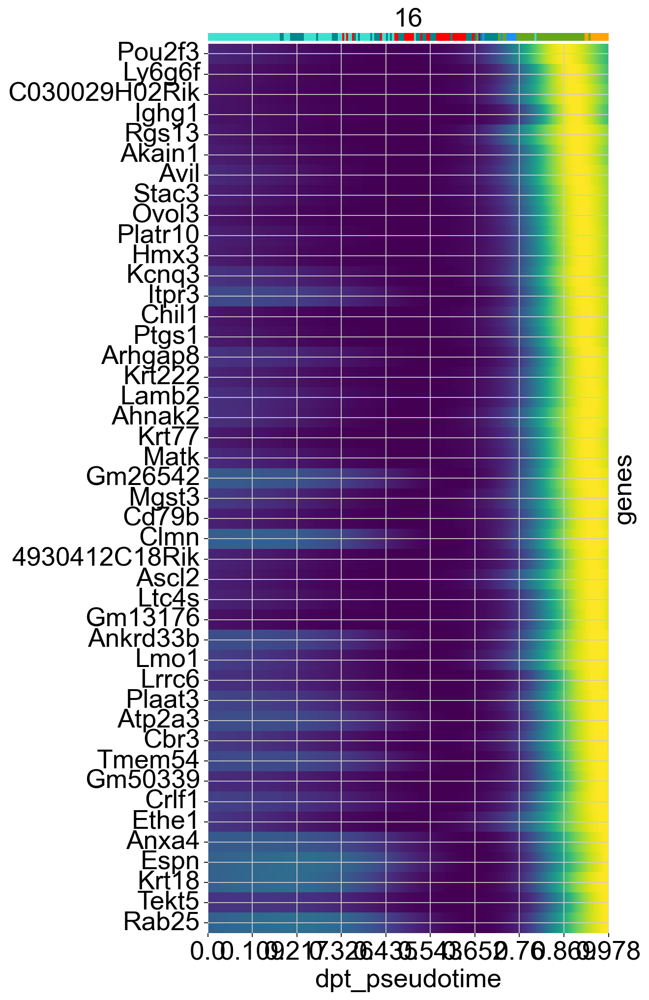

In [25]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["16"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [26]:
# Compute lineage drivers
ne_drivers = g.compute_lineage_drivers(
    lineages="11",
    model=model)

genes = ne_drivers.head(50).index
genes

Index(['Tmem163', '9530059O14Rik', 'Foxp1', 'Dach2', 'Npy1r', 'Alcam', 'Tshz2',
       'Usp29', 'Meis2', 'Peg3', 'Adprhl1', 'Kcnh5', 'Cd47', 'Vstm2a', 'Mdga2',
       'Ryr3', 'Pde8b', 'Zdhhc2', 'Mpped2', 'Asxl3', 'Plxna4', 'Runx1t1',
       'Sema6d', 'Ascl1', 'D430041D05Rik', 'Pcsk1n', 'Syt1', 'Atp8a2', 'Lin7a',
       'Iqcj', 'Hecw2', 'Klhl13', 'Cntn3', 'Enox1', 'G630016G05Rik', 'Trpc3',
       'Car10', 'Npas3', 'Jazf1', 'Iqschfp', 'Kcnh8', 'Piezo2', 'Dlx6os1',
       'Zfhx3', 'Pou3f4', 'Cpne7', 'Ctnna2', 'Ptgds', 'Cacna1a', 'Rufy3'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

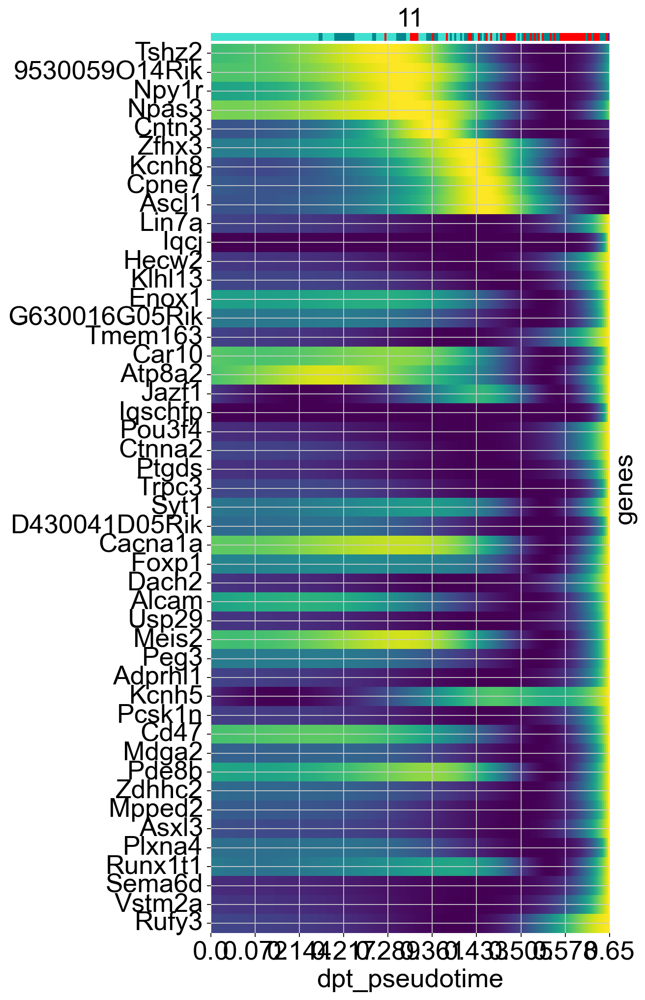

In [27]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["11"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [28]:
# Compute lineage drivers
neuronal_drivers = g.compute_lineage_drivers(
    lineages="9",
    model=model)

genes = neuronal_drivers.head(50).index
genes

Index(['Neurod1', 'Tmsb4x', 'Tmem178', 'Stmn2', 'Igfbpl1', 'Tubb3', 'Cotl1',
       'Igsf21', 'Tubb2b', 'Slc1a2', 'Klhl29', 'Clvs1', 'Ttc39b', 'Myt1l',
       'Rtn1', 'Nfib', 'Rbfox3', 'Gdpd5', 'Csrnp3', 'Tnik', 'Mapt', 'Nsg2',
       'Zfp423', 'Celf2', 'Gabbr2', 'Sox4', 'E130114P18Rik', 'Mir100hg',
       'Tecta', 'Dscam', 'Apba2', 'Ncam1', 'Csmd3', '5033421B08Rik', 'Tuba1a',
       'Gm26871', 'Mir124a-1hg', 'B230216N24Rik', 'Gpm6b', 'Slc17a6', 'Cerkl',
       'Mfap4', 'Zfp536', 'Prdm8', 'Bach2', 'Zbtb18', 'Cemip2', 'Stmn1',
       'Akap6', 'Nfix'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

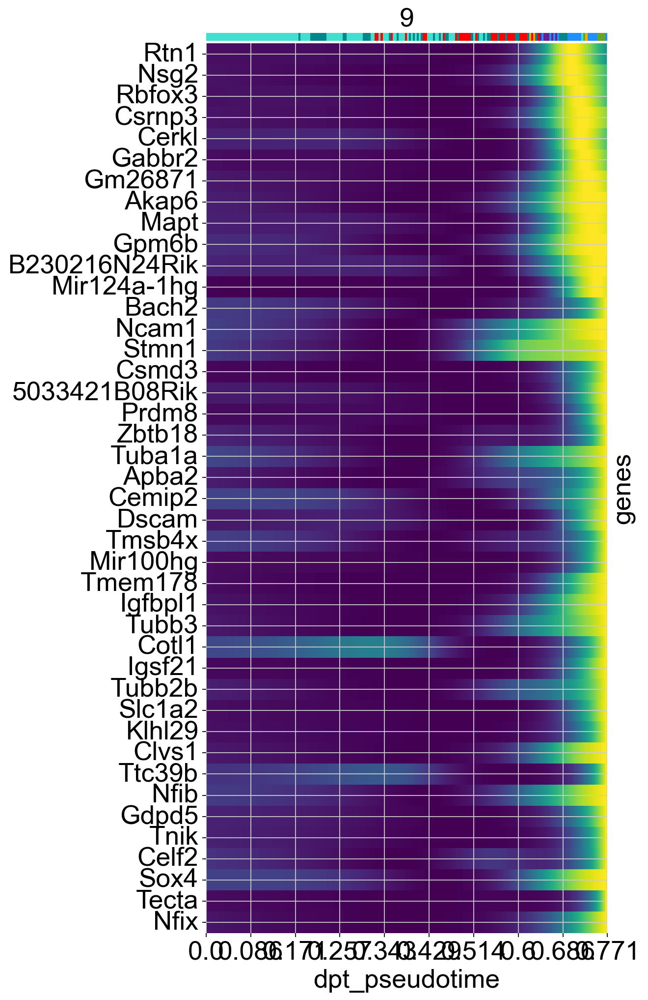

In [29]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["9"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [30]:
# Compute lineage drivers
ne_n_drivers = g.compute_lineage_drivers(
    lineages="0",
    model=model)

genes = ne_n_drivers.head(50).index
genes

Index(['Sox6', 'Fli1', 'Atp2b2', 'Slc6a5', 'Prox1os', 'Acvr1', 'Cadm2',
       'Pcdh10', 'Dpp6', 'Plcxd3', 'Prox1', 'Sox1', 'Syt1', 'Tox3', 'Fam102b',
       'Ptprn2', 'Pou6f2', 'Ank', 'Adgrb3', 'Sp9', 'Ddc', 'St18', 'Gm19990',
       'S100a16', 'Dclk2', 'Pcdh8', 'A530058N18Rik', 'Kdm7a', 'Htr3a', 'Cntn5',
       'A530058N18Rik-1', 'Mbip', 'Sfta3-ps', 'Ckb', 'Gpr179', 'Nav2',
       'Gm45025', 'Fgd3', 'Thsd7a', 'Dner', 'Ppargc1a', 'Ntn4', 'Camk2d',
       'Gm10421', 'Npnt', 'Sp3', 'Hs3st4', 'Rufy3', 'Gm37474', 'Maged1'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

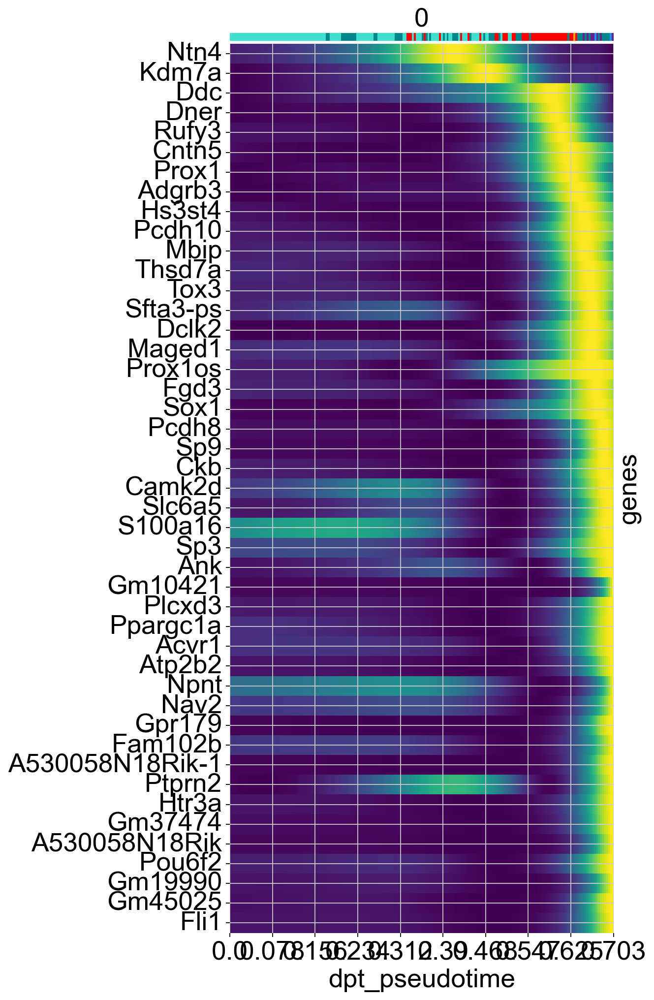

In [31]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["0"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [32]:
# Compute lineage drivers
atoh_drivers = g.compute_lineage_drivers(
    lineages="6",
    model=model)

genes = atoh_drivers.head(50).index
genes

Index(['Ccer2', 'Tmem255b', 'Pcp4', 'Myo6', 'Selenom', 'Atoh1', 'Pou4f3',
       'Lmod1', 'Cfap61', 'Kif19a', 'Ankrd24', 'Cryab', 'Rasd2', 'Ush2a',
       'Raver2', 'Ebf1', 'D7Ertd443e', 'Pls1', 'Barhl1', 'Lhfpl5', 'Ptprq',
       'Tnc', '6530403H02Rik', 'Pcdh20', 'Calml4', 'Cldn14', 'Lhx3', 'Dlk2',
       'Slc2a13', 'Fmn1', 'Rbm24', 'Grxcr2', 'Mreg', 'Ralyl', 'Mob3b', 'Myo3b',
       'Gm2694', 'Rab15', 'Acbd7', 'Zmat4', 'Clrn1', 'Elmod1', 'Cldn9', 'Evl',
       'Gm50397', 'Trnp1', 'Casz1', 'Helt', 'Xirp2', 'Lnx2'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

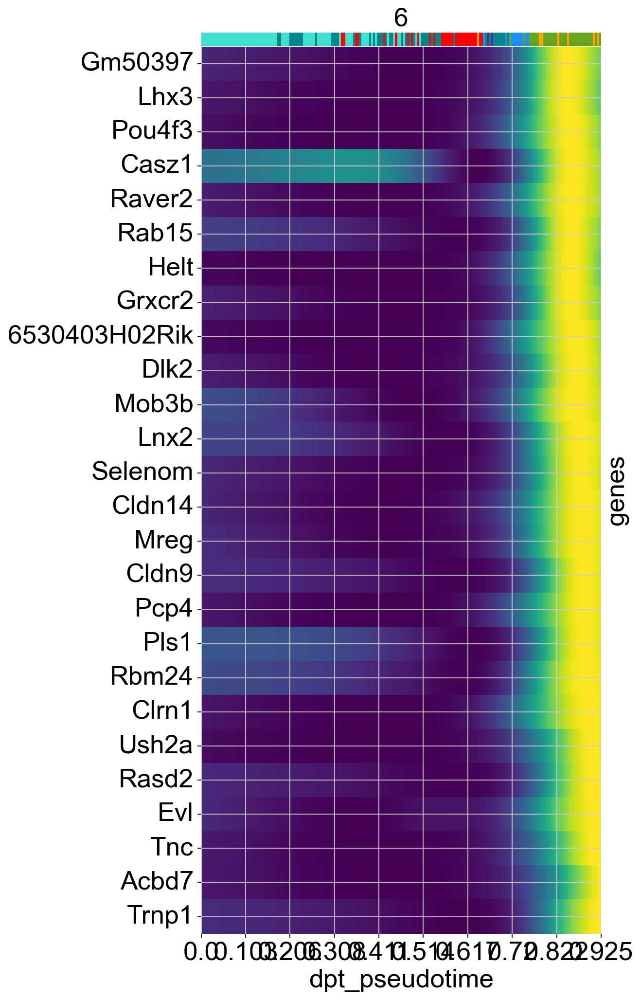

In [33]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["6"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [34]:
# Compute lineage drivers
basal_drivers = g.compute_lineage_drivers(
    lineages="17",
    model=model)

genes = basal_drivers.head(50).index
genes

Index(['S100a11', '2200002D01Rik', 'Anxa3', 'Runx1', 'Ahr', 'Cwh43', 'Aqp4',
       'Myof', 'Wnt7b', 'Ikzf2', 'Tacstd2', 'Sat1', 'Scel', 'Muc4', 'Mecom',
       'Ctsh', 'Samd9l', 'Ptpn13', 'Atp10b', 'Sftpd', 'Cxcl17', 'Il18r1',
       'Parp14', 'Epas1', 'Vwa5a', 'Cd44', 'Slc4a4', 'Muc1', 'Arhgef5',
       'H2-D1', 'Ahnak', 'Bhlhe40', 'Gabrp', 'Egln3', 'Msln', 'Anxa8', 'F3',
       'Acer3', 'Itga2', 'Rbm47', 'B2m', 'Ptges', 'Myh9', 'Lgals3', 'Nlrp10',
       'Gprc5a', 'Myo1d', 'Pkp1', 'Slc39a4', 'Anxa2'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

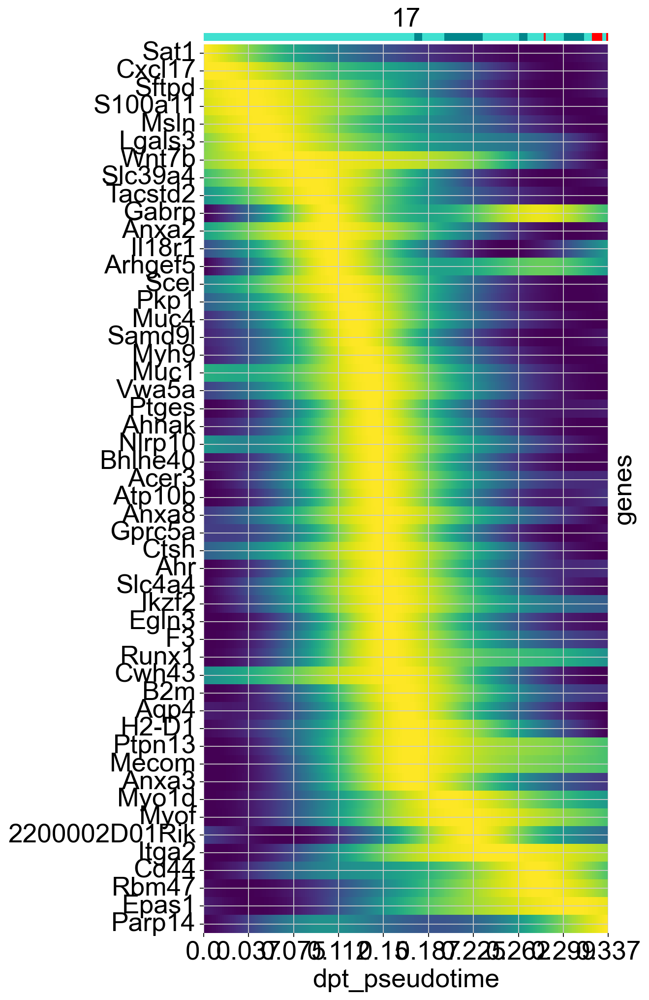

In [35]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["17"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [36]:
# Compute lineage drivers
epith_hillock_drivers = g.compute_lineage_drivers(
    lineages="10",
    model=model)

genes = epith_hillock_drivers.head(50).index
genes

Index(['Cldn3', 'Cldn7', 'Gpx2', 'Ifitm1', 'Rbp4', 'Rac3', 'Mpzl2', 'Rab25',
       'Cldn10', 'Ifitm3', 'Gadd45b', 'Dennd2d', 'Smim31', 'Anxa1', 'Bspry',
       'Cyb5a', 'Ffar4', 'Pla2g10', 'Tmem266', 'Adig', 'Crb3', 'Gm13203',
       'Cdc34', 'Tmem156', 'Cldn6', 'Kcnk1', 'Lypd2', 'Ecscr', 'Atp6v0e',
       'Arhgef38', 'Epcam', 'Asprv1', 'Prss12', 'Smim6', 'Abhd11', 'St14',
       'Venus', 'Dph3', 'Utf1', 'fLuc', 'Cldn4', 'Cmtm8', '1500015L24Rik',
       'Isyna1', 'Mal2', 'Dnase2a', 'Apobec1', 'Map4k1', 'Pla2g12a', 'Prss8'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

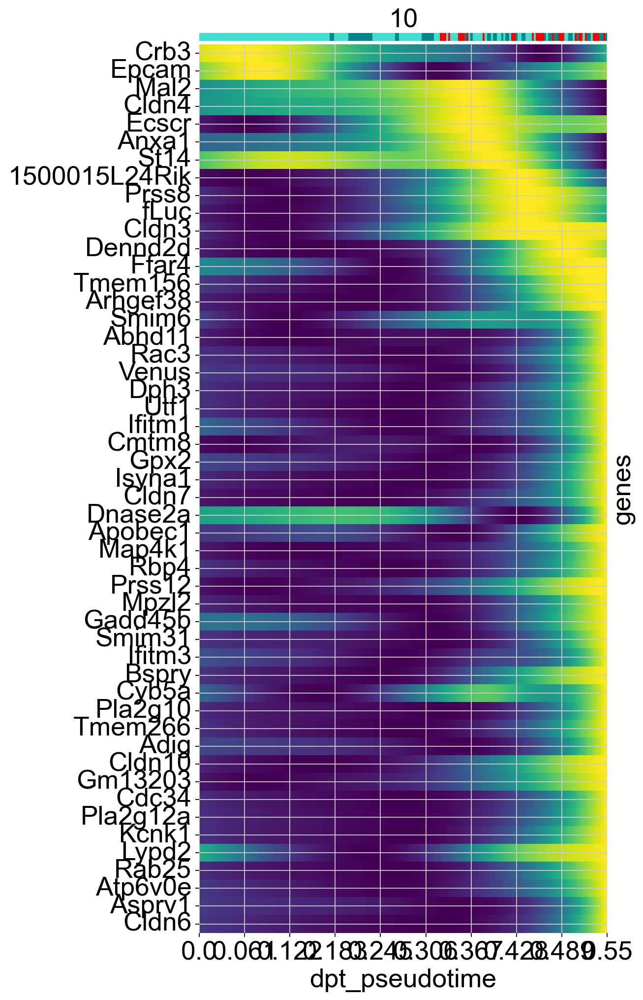

In [37]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["10"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [38]:
# Compute lineage drivers
stem_drivers = g.compute_lineage_drivers(
    lineages="13",
    model=model)

genes = stem_drivers.head(50).index
genes

Index(['Rpl26', 'Rpl6', 'Rpl38', 'Rack1', 'Rpl27', 'Rps4l', 'Rpl23', 'Rpl23a',
       'Rpl13', 'Rpl9', 'Rplp0', 'Rps8', 'Rpl19', 'Serpinh1', 'Rpl8', 'Lgals1',
       'Gm5148', 'Rps6', 'Hspe1', 'Rpl30', 'Wdr31', 'Gm49701', 'Rpl21', 'Fzd2',
       'Txn1', 'Atp5g1', 'Rps27a', 'Rpl18', 'Hspe1-rs1', 'Rpl28', 'Tomm7',
       'Eef1d', 'Alyref', 'Psmb3', 'Rpl7', 'Ran', 'Rpl22', 'Lpl', 'Npm1',
       'Dpm3', 'Nhp2', 'Rps10', 'Lyar', 'Mrpl22', 'Twist1', 'Car14', 'Hadh',
       'Atp5h', 'Rpl27a', 'Nme2'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

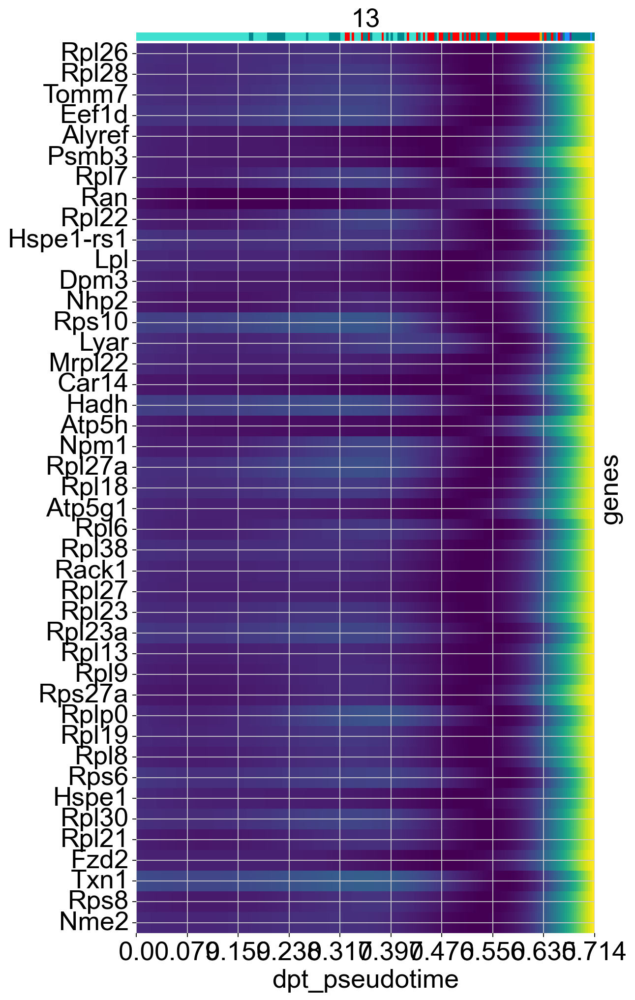

In [39]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["13"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

In [40]:
# Compute lineage drivers
mes_drivers = g.compute_lineage_drivers(
    lineages="5",
    model=model)

genes = mes_drivers.head(50).index
genes

Index(['Emp3', 'Vim', 'Cavin3', 'Ifitm2', 'Bgn', 'AI662270', 'Timp2', 'Aldoc',
       'Gramd1c', 'Fstl1', 'Cd63', 'Gas1', 'Cox4i2', 'Trf', 'Ccn4', 'Ptn',
       'Dbi', 'Ifitm3', 'Sparc', 'Tspan4', 'Cebpb', 'Gm26760', 'Gfap', 'Igf2',
       'Ppp1r1b', 'Rhoj', 'Scrg1', 'Cyba', 'Cavin1', 'H19', 'Igfbp4', 'Mfap2',
       'Kazald1', 'Copz2', 'Fkbp10', 'Atp1a2', 'Ssr4', 'Sox9', 'Tcf7l2',
       'Slc9b1', 'Fgfr1', 'Fxyd1', 'Tubb6', 'Eln', 'Vtn', 'Mgp', 'Rps13',
       'Sec16b', 'Cst3', 'Col9a1'],
      dtype='object')

  0%|          | 0/50 [00:00<?, ?gene/s]

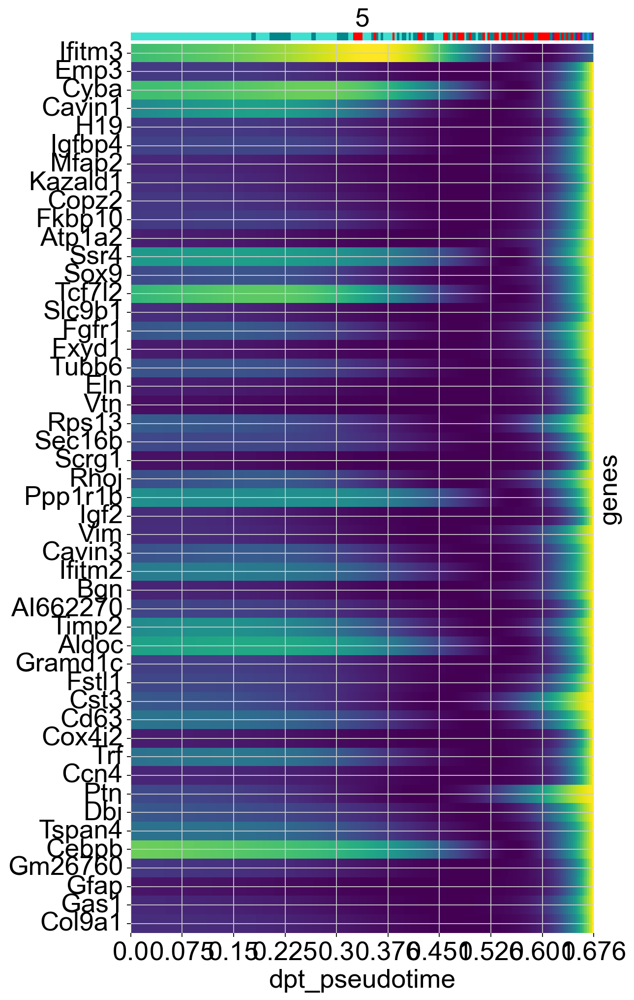

In [41]:
cr.pl.heatmap(
    adata2,
    model=model,lineages=["5"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 15))

## Try top 100, clustered

  0%|          | 0/100 [00:00<?, ?gene/s]

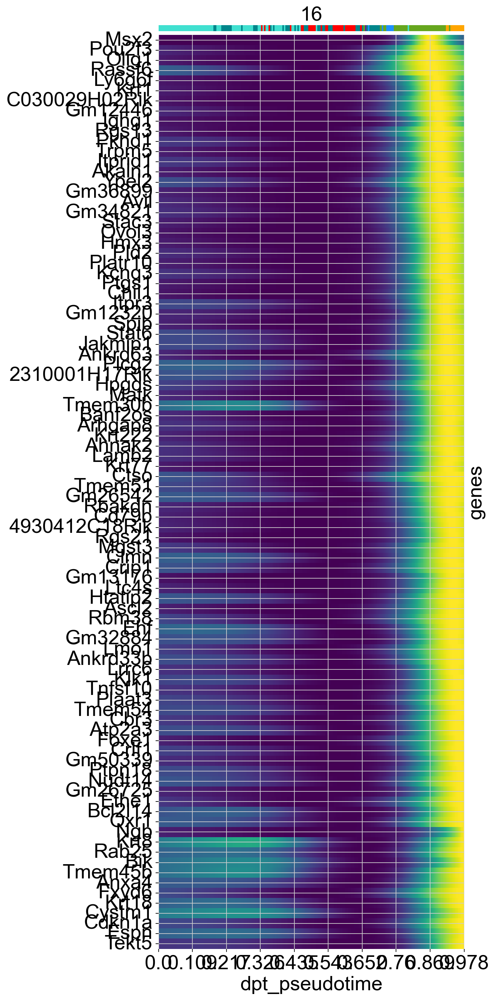

In [42]:
genes = tuft_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["16"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

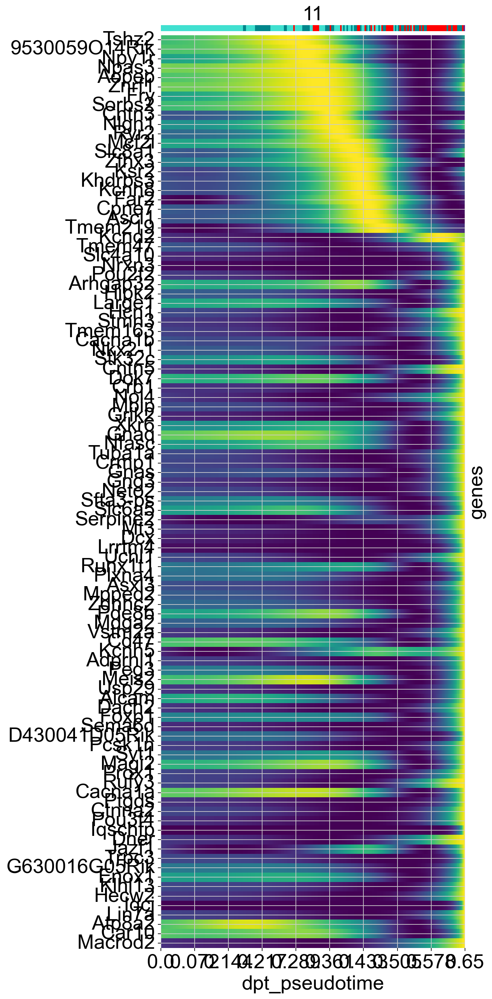

In [43]:
genes = ne_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["11"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

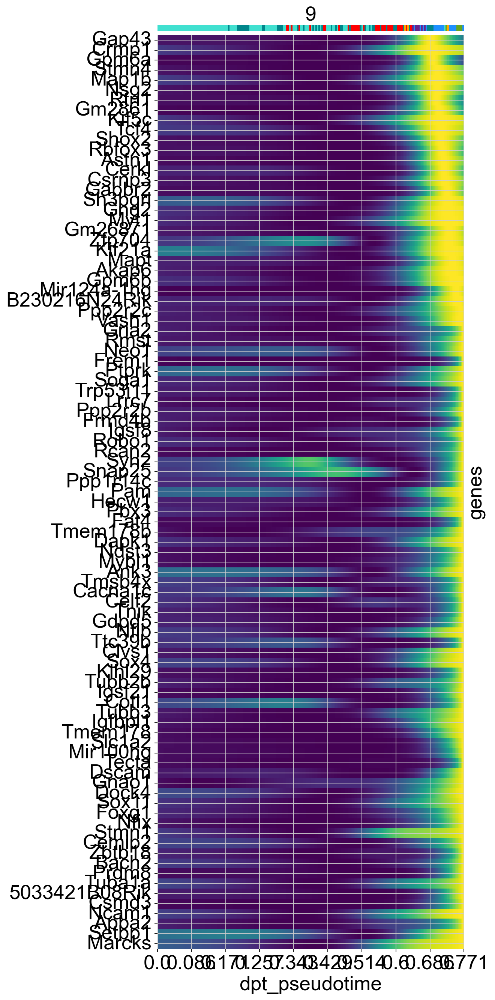

In [44]:
genes = neuronal_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["9"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

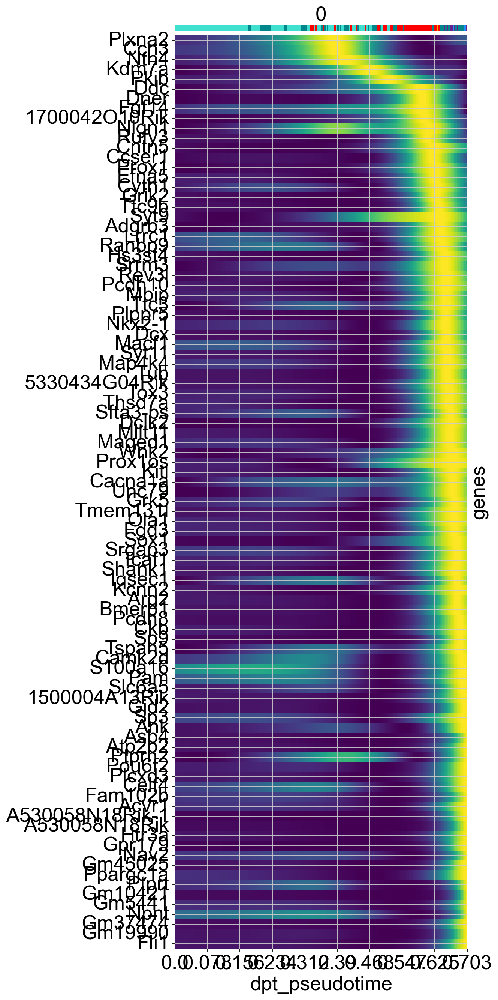

In [45]:
genes = ne_n_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["0"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

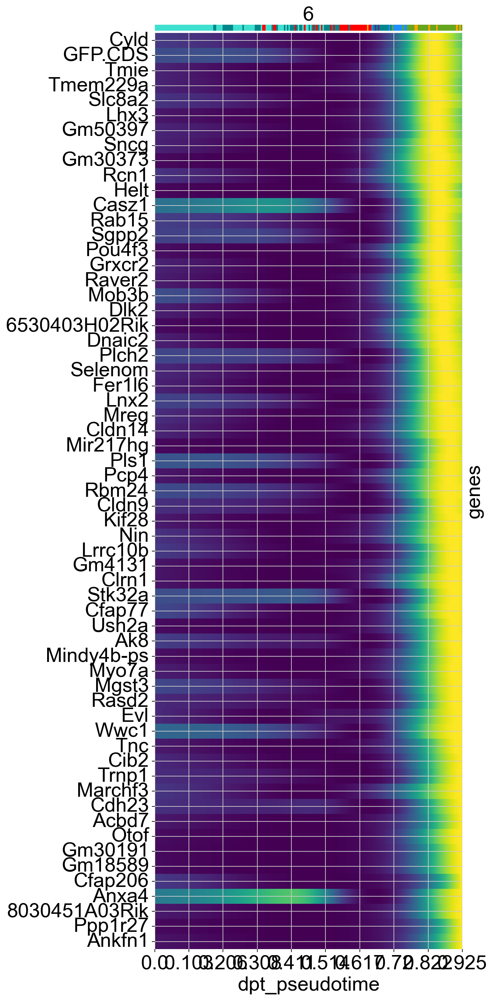

In [46]:
genes = atoh_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["6"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

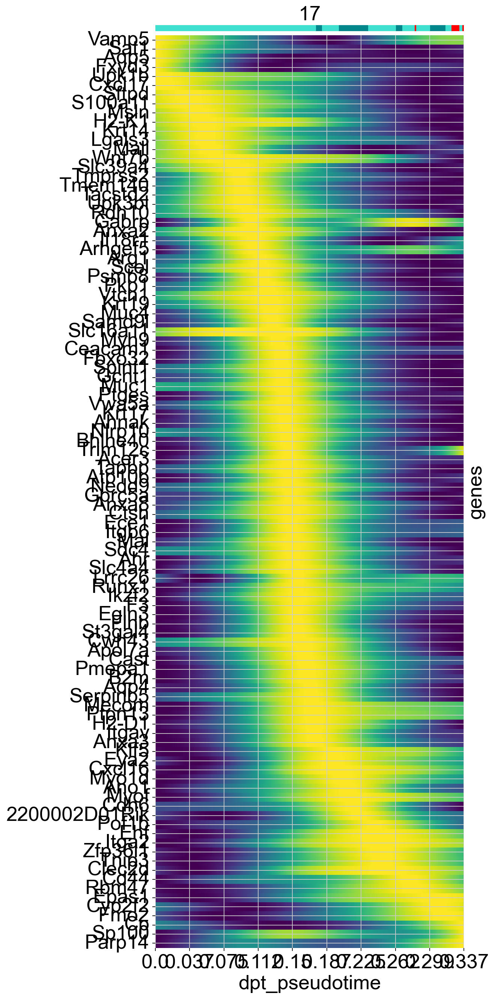

In [47]:
genes = basal_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["17"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

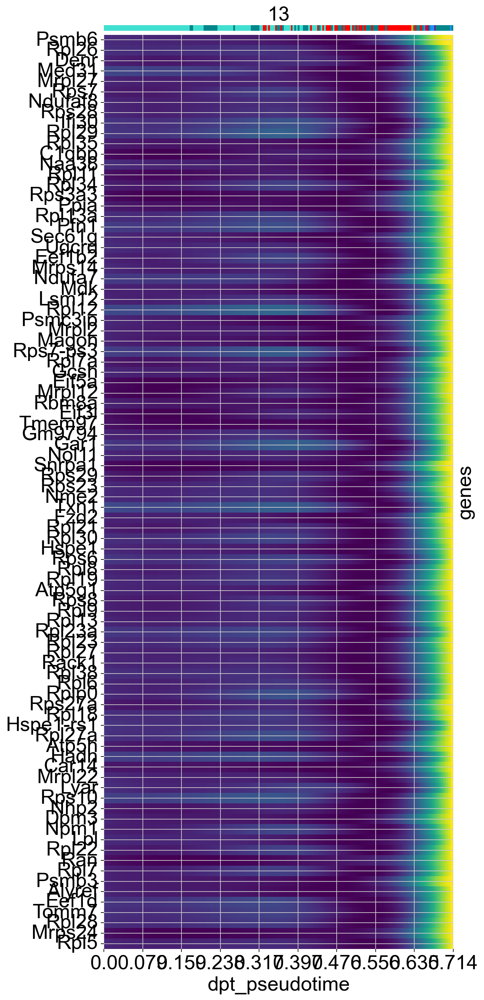

In [48]:
genes = stem_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["13"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

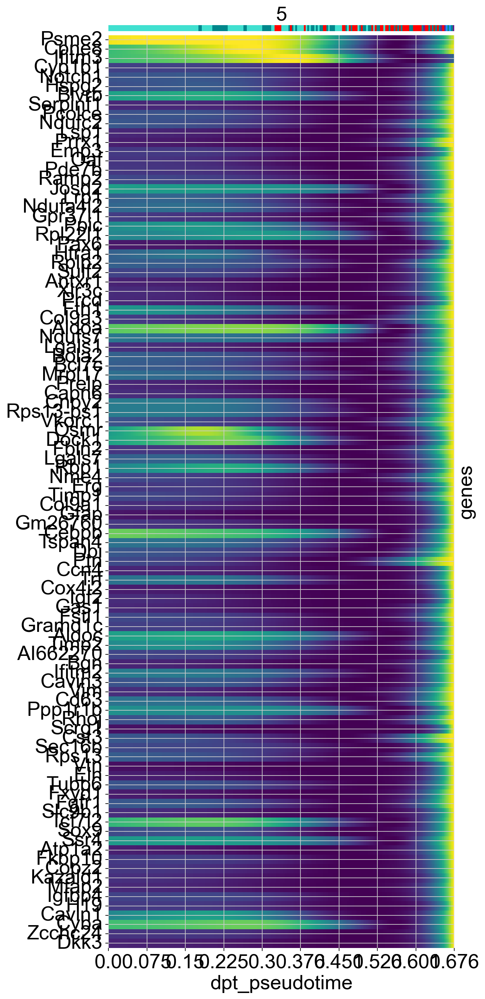

In [49]:
genes = mes_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["5"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

  0%|          | 0/100 [00:00<?, ?gene/s]

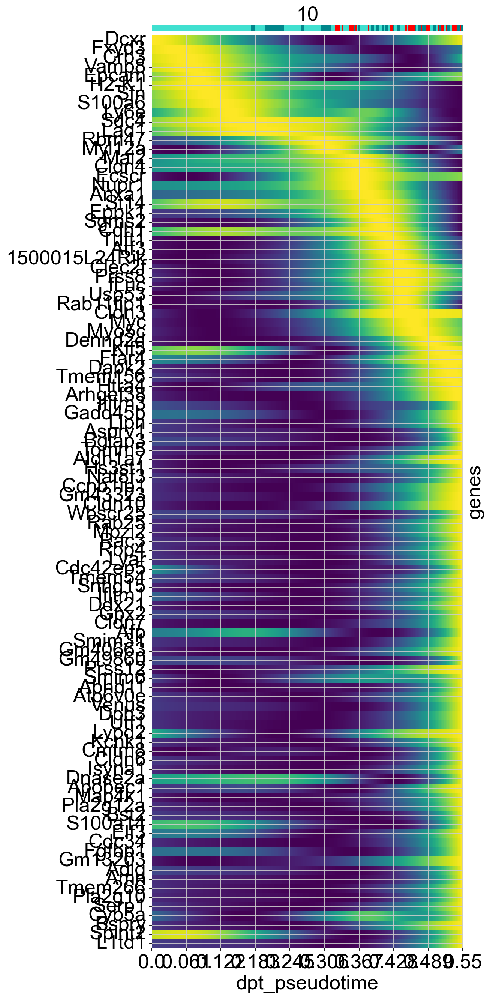

In [50]:
genes = epith_hillock_drivers.head(100).index

cr.pl.heatmap(
    adata2,
    model=model,lineages=["10"],return_models=False,
    genes=genes, cbar=False,
    time_key="dpt_pseudotime",
    show_fate_probabilities=False,
    show_all_genes=True, cluster_key="leiden_scVI_1.2", cluster_genes=False, figsize=(10, 20))

## End of analysis in Scanpy, move to Seurat in R for calculation of gene signatures and additional plot generation/visualization. Additional CellTag analyses were also performed in R. To do this, convert resulting h5ad anndata object from this script as a Seurat object in R.